# Clustering to Help Identify Probable Endothelial Cells

### 1. Import Required Packages 
### 2. Import Prior Data 
### 3. Subset Data to Include Predominantly Endothelial Cells
### 4. Determine Top 2000 Variable Genes in Predominantly Endothelial Cells
### 5. Integration Cells with scVI <br>  5.1 Calculate neighbors and Conduct Leiden Clustering on 2000 highly variable gene adata <br> 5.2 Calculate neighbors and Conduct Leiden Clustering on ALL GENES adata 
### 6. Differential Gene Expression Analysis to Determine Unknown Clusters
### 7. Determine the Celltype of Each Cluster 
### 8. Label Cell Types in Adata Object:
### 9. Conclusions

## <br> 1. Import Required Packages

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import anndata as ad

from scvi.model.utils import mde
from scipy import sparse
from anndata import AnnData
from anndata.experimental.multi_files import AnnCollection

[rank: 0] Global seed set to 0


Set figure parameters.

In [3]:
sc.set_figure_params(figsize=(10, 8))
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'
pd.options.display.max_colwidth = 200

## <br> 2. Import Prior Clustered Data

In [ ]:
adata = ad.read_h5ad('./Adata_Objects/01b_AllGenes_Clustered.h5ad')

In [ ]:
adata.raw

In [ ]:
print(adata)

## <br> 3. Subset Predominantly Endothelial Cells

Based on previous clustering analysis and data transfer from original TC analysis using Seurat, the immune cells in the various clusters have been vaguely identified and subset using the following code. 

In [ ]:
sc.pl.umap(
    adata,
    color=["leiden_scVI_res_0.25"],
    frameon=False,
    size=7,
)

In [ ]:
adata_endo = adata[(adata.obs['leiden_scVI_res_0.25'] == '2')
                     ]

In [ ]:
print(adata_endo)

Copy adata object to integrate clustering resultering with adata object that contains all genes

In [ ]:
adata_endo_subset = adata_endo.copy()
adata_endo_subset_ALL_GENES = adata_endo_subset.copy()

## <br> 4. Determine top 2000 variable genes for clustering (subsets only top 2000 genes)

In [ ]:
sc.pp.highly_variable_genes(
    adata_endo_subset,
    flavor="cell_ranger",
    n_top_genes=2000,
    #layer="counts",
    batch_key="OrigIdent",
    subset=True,
)

## <br> 5. Integration Cells with scVI

Expects raw counts as input

In [11]:
scvi.model.SCVI.setup_anndata(adata_endo_subset, 
                              layer="counts", 
                              batch_key="OrigIdent",
                              categorical_covariate_keys=["Dose", "Time"],
                              continuous_covariate_keys=["pct_counts_mt"],
                             )

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


Train Model

In [12]:
HV_Genes_model_endo = scvi.model.SCVI(adata_endo_subset, n_layers=2, n_latent=10)

In [13]:
HV_Genes_model_endo.train()

/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /mnt/home/cholicog/miniconda3/envs/scvi-env/lib/pyth ...
  rank_zero_warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /mnt/home/cholicog/miniconda3/envs/scvi-env/lib/pyth ...
  rank_zero_warn(


Epoch 318/318: 100%|██████████| 318/318 [44:48<00:00,  7.53s/it, loss=687, v_num=1]  

`Trainer.fit` stopped: `max_epochs=318` reached.


Epoch 318/318: 100%|██████████| 318/318 [44:48<00:00,  8.45s/it, loss=687, v_num=1]


Save Model

In [14]:
HV_Genes_model_endo.save("./Models/HV_Genes_Endo_Latent10/", save_anndata=True)

Load Model (if restarting)

In [ ]:
HV_Genes_model_endo = scvi.model.SCVI.load("./Models/HV_Genes_Endo_Latent10/")

Save trained data to AnnData Objects

In [ ]:
adata_endo_subset.obsm["X_scVI_train_endo"] = HV_Genes_model_endo.get_latent_representation()
adata_endo_subset_ALL_GENES.obsm["X_scVI_train_endo"] = HV_Genes_model_endo.get_latent_representation()

### <br> 5.1 Calculate neighbors and Conduct Leiden Clustering on 2000 highly variable gene adata

/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


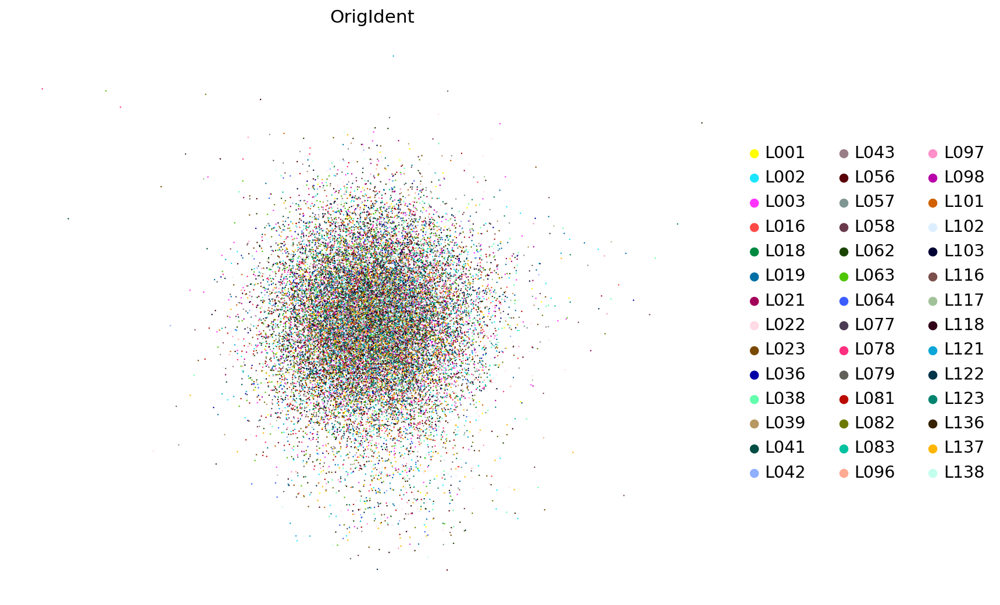

In [13]:
sc.pl.embedding(
    adata_endo_subset,
    basis="X_scVI_train_endo",
    color=["OrigIdent"],
    frameon=False,
    ncols=1,
)

In [14]:
sc.pp.neighbors(adata_endo_subset, 
                use_rep="X_scVI_train_endo", 
                random_state=5,
                method='umap'
               )

/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numba/core/cpu.py:97: UserWarning: Numba extension module 'sparse._numba_extension' failed to load due to 'ModuleNotFoundError(No module named 'numba.targets')'.
  numba.core.entrypoints.init_all()
2023-09-15 13:21:46.363836: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:7704] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-09-15 13:21:46.363932: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-09-15 13:21:46.363962: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1520] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-09-15 13:21:49.773278: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT W

In [15]:
sc.tl.umap(adata_endo_subset, 
           min_dist=0.1,
           random_state=5
          )

/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


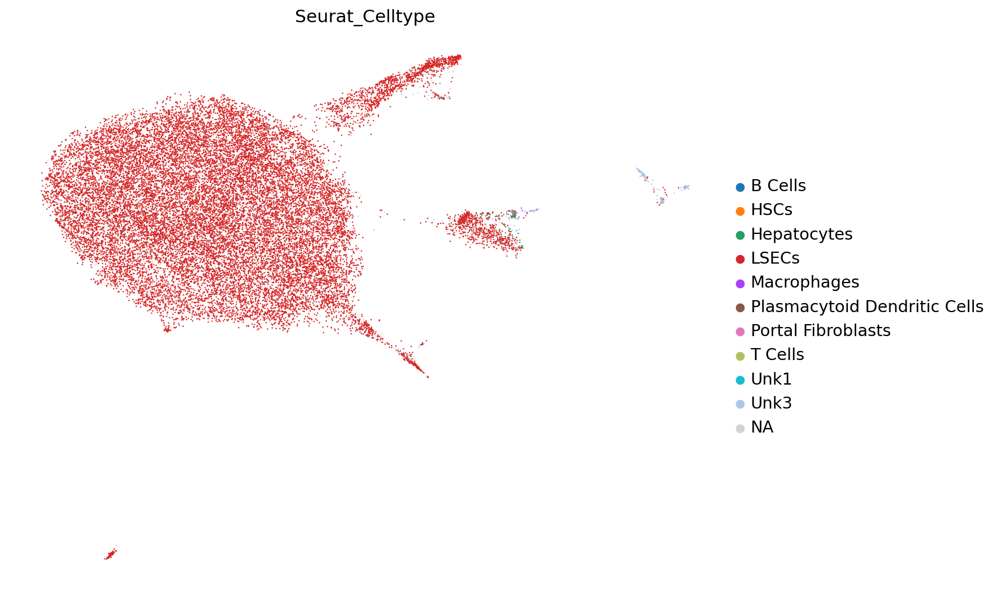

In [16]:
sc.pl.umap(
    adata_endo_subset,
    color=["Seurat_Celltype"],
    frameon=False,
    size=5,
    #save='_Clustering-Seurat_Celltype_immune.pdf'
)

In [17]:
sc.tl.leiden(adata_endo_subset, key_added="leiden_scVI_res_0.05_endo", resolution=0.05)
sc.tl.leiden(adata_endo_subset, key_added="leiden_scVI_res_0.1_endo", resolution=0.1)
sc.tl.leiden(adata_endo_subset, key_added="leiden_scVI_res_0.25_endo", resolution=0.25)
sc.tl.leiden(adata_endo_subset, key_added="leiden_scVI_res_0.5_endo", resolution=0.5)
sc.tl.leiden(adata_endo_subset, key_added="leiden_scVI_res_0.75_endo", resolution=0.75)

/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


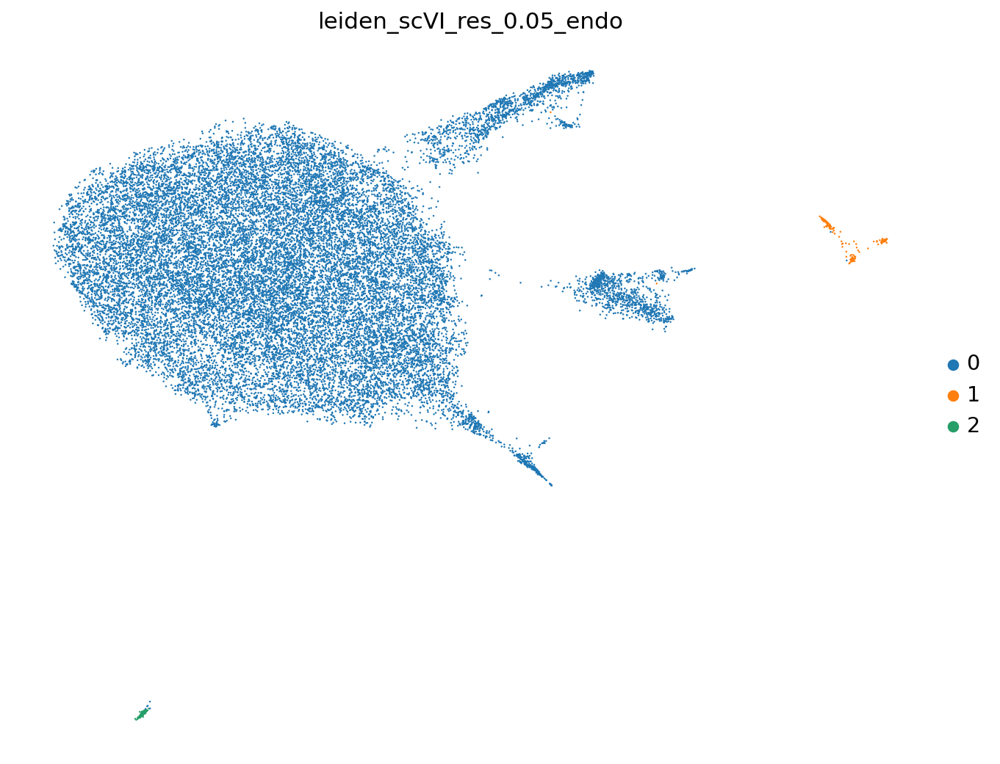

In [18]:
sc.pl.umap(
    adata_endo_subset,
    color=["leiden_scVI_res_0.05_endo"],
    frameon=False,
    size=5,
    #save='_Clustering-Res_0.05_immune.pdf'
)

/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


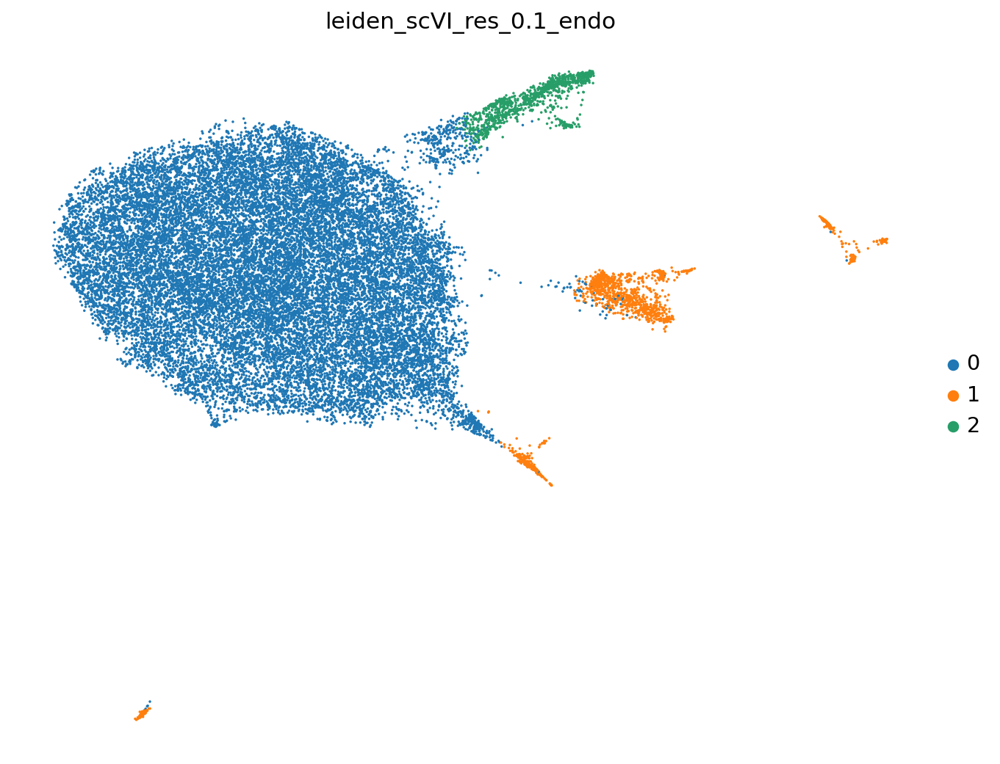

In [19]:
sc.pl.umap(
    adata_endo_subset,
    color=["leiden_scVI_res_0.1_endo"],
    frameon=False,
    size=10,
    #save='_Clustering-Res_0.1_immune.pdf'
)

/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


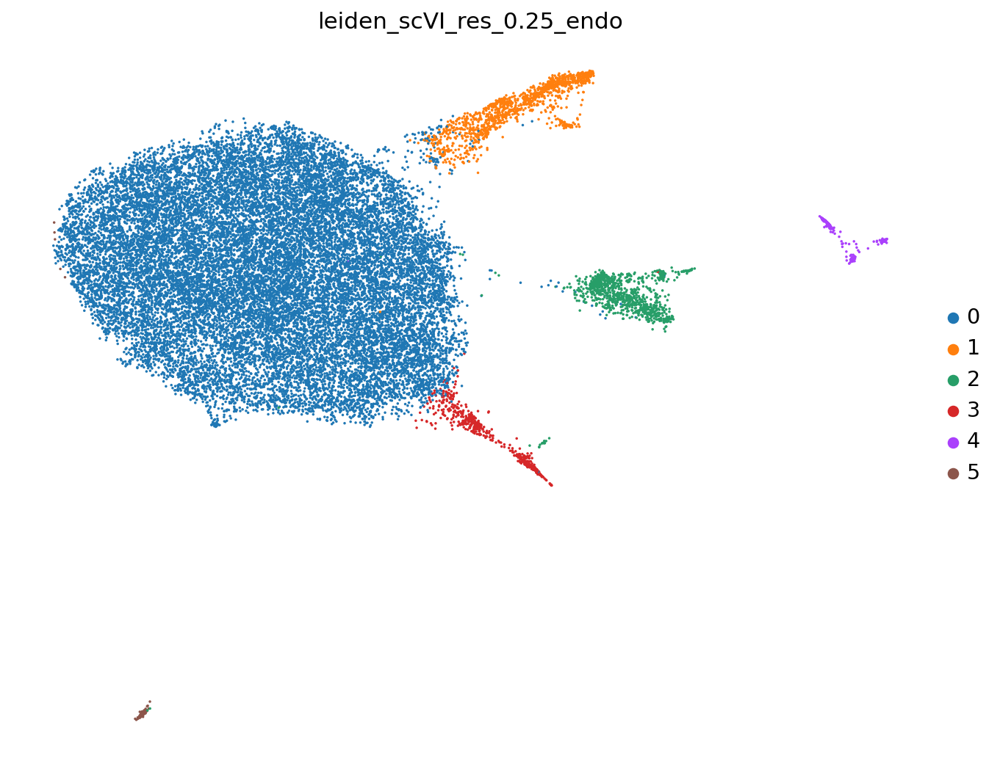

In [20]:
sc.pl.umap(
    adata_endo_subset,
    color=["leiden_scVI_res_0.25_endo"],
    frameon=False,
    size=10,
    #save='_Clustering-Res_0.25_immune.pdf'
)

/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


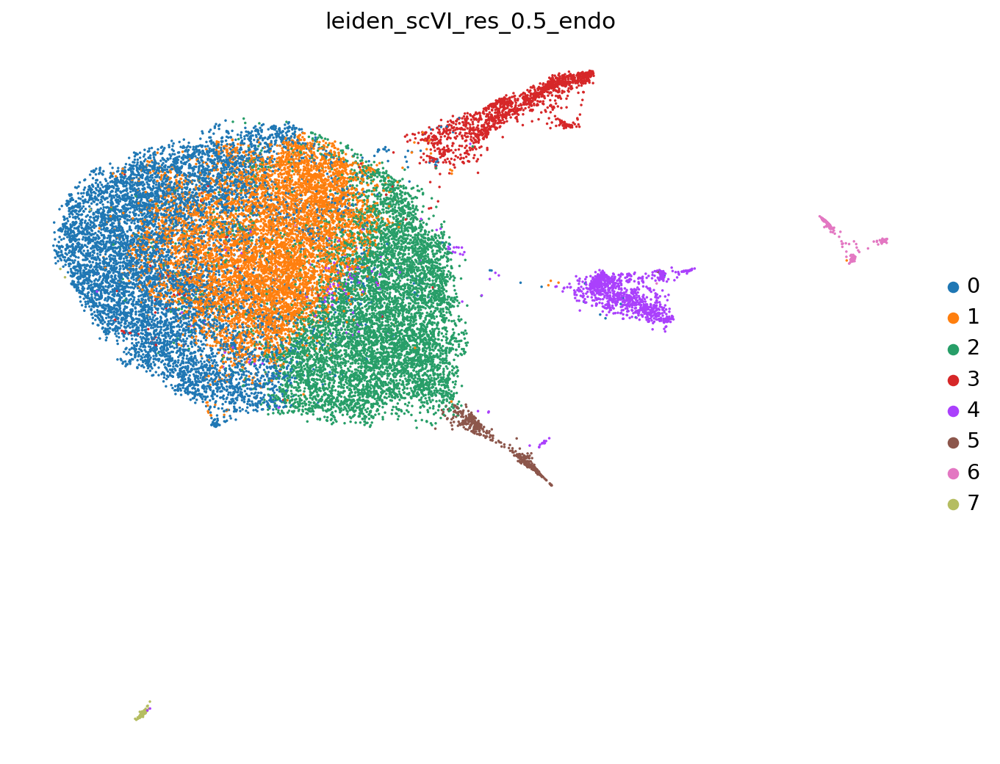

In [21]:
sc.pl.umap(
    adata_endo_subset,
    color=["leiden_scVI_res_0.5_endo"],
    frameon=False,
    size=10,
    #save='_Clustering-Res_0.5_immune.pdf'
)

/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


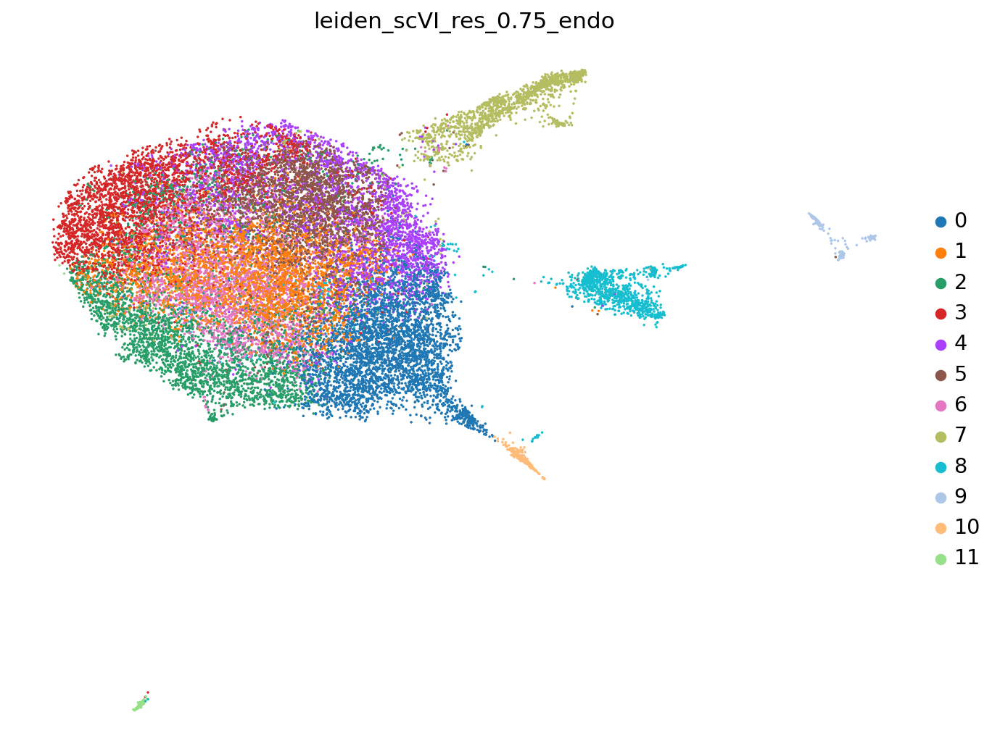

In [22]:
sc.pl.umap(
    adata_endo_subset,
    color=["leiden_scVI_res_0.75_endo"],
    frameon=False,
    size=10,
    #save='_Clustering-Res_0.75_immune.pdf'
)

Save AnnData Object

In [23]:
adata_endo_subset.write_h5ad('./Adata_Objects/01e_HVGenes_Clustered_Endo.h5ad',compression='gzip')

Load AnnData Object

In [3]:
adata_endo_subset = ad.read_h5ad('./Adata_Objects/01e_HVGenes_Clustered_Endo.h5ad')

### <br> 5.2 Calculate neighbors and Conduct Leiden Clustering on ALL GENES adata

In [24]:
sc.pp.neighbors(adata_endo_subset_ALL_GENES, 
                use_rep="X_scVI_train_endo", 
                random_state=5,
                method='umap'
               )

In [25]:
sc.tl.umap(adata_endo_subset_ALL_GENES, 
           min_dist=0.1,
           random_state=5
          )

In [26]:
sc.tl.leiden(adata_endo_subset_ALL_GENES, key_added="leiden_scVI_res_0.05_endo", resolution=0.05)
sc.tl.leiden(adata_endo_subset_ALL_GENES, key_added="leiden_scVI_res_0.1_endo", resolution=0.1)
sc.tl.leiden(adata_endo_subset_ALL_GENES, key_added="leiden_scVI_res_0.25_endo", resolution=0.25)
sc.tl.leiden(adata_endo_subset_ALL_GENES, key_added="leiden_scVI_res_0.5_endo", resolution=0.5)
sc.tl.leiden(adata_endo_subset_ALL_GENES, key_added="leiden_scVI_res_0.75_endo", resolution=0.75)

Save AnnData Object

In [27]:
adata_endo_subset_ALL_GENES.write_h5ad('./Adata_Objects/01e_AllGenes_Clustered_Endo.h5ad',compression='gzip')


Load AnnData Object

In [ ]:
adata_endo_subset_ALL_GENES = ad.read_h5ad('./Adata_Objects/01e_AllGenes_Clustered_Endo.h5ad')

# <br> 6. Rank Genes Wilcoxon (One Celltype vs. Rest) 

In [28]:
adata_endo_subset_ALL_GENES

AnnData object with n_obs × n_vars = 25125 × 22917
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'Barcode', 'OrigIdent-Barcode', 'Seurat_Celltype', 'doublet_scores', 'predicted_doublets', 'doublet_info', 'leiden_scVI_res_0.05', 'leiden_scVI_res_0.1', 'leiden_scVI_res_0.25', 'leiden_scVI_res_0.5', 'leiden_scVI_res_0.75', 'leiden_scVI_res_1.50', 'leiden_scVI_res_0.05_endo', 'leiden_scVI_res_0.1_endo', 'leiden_scVI_res_0.25_endo', 'leiden_scVI_res_0.5_endo', 'leiden_scVI_res_0.75_endo'
    uns: 'OrigIdent_colors', 'doublet_info_colors', 'leiden', 'log1p', 'neighbors', 'umap', 'leiden_scVI_res_0.25_colors'
    obsm: 'X_scVI', 'X_umap', 'X_scVI_train_endo'
    layers: 'counts', 'log1p_counts'
    obsp: 'connectivities', 'distances'

In [29]:
sc.pp.normalize_total(adata_endo_subset_ALL_GENES, target_sum=1e4)
sc.pp.log1p(adata_endo_subset_ALL_GENES)

In [30]:
sc.tl.rank_genes_groups(adata_endo_subset_ALL_GENES, 
                        groupby='leiden_scVI_res_0.5_endo', 
                        method='wilcoxon', 
                        key_added = "leiden_scVI_res_0.5_endo_wilcoxon"
                       )

Save AnnData Object

In [31]:
adata_endo_subset_ALL_GENES.write_h5ad('./Adata_Objects/01e_AllGenes_Clustered_Endo.h5ad',compression='gzip')


Load AnnData Object

In [4]:
adata_endo_subset_ALL_GENES = ad.read_h5ad('./Adata_Objects/01e_AllGenes_Clustered_Endo.h5ad')

### <br> Example on how to view results

In [5]:
sc.get.rank_genes_groups_df(adata_endo_subset_ALL_GENES, group='0', 
                            key='leiden_scVI_res_0.5_endo_wilcoxon')[:10]

,names,scores,logfoldchanges,pvals,pvals_adj
0,Kit,59.771629,2.024124,0.000000e+00,0.000000e+00
1,Cdh13,57.918728,2.677003,0.000000e+00,0.000000e+00
2,Plpp1,40.625523,0.957193,0.000000e+00,0.000000e+00
3,Ralgapa2,37.937386,0.692955,0.000000e+00,0.000000e+00
4,Prickle1,37.591808,0.785455,2.925500e-309,1.340874e-305
5,Tshz2,36.794933,0.720731,2.224855e-296,8.497834e-293
6,Rarb,36.546474,1.256062,2.028489e-292,6.640983e-289
7,Dlc1,33.772400,0.611122,5.014949e-250,1.436595e-246
8,Stox2,33.332424,0.715578,1.309566e-243,3.334592e-240
9,Pard3b,33.097549,0.713399,3.223272e-240,7.386772e-237


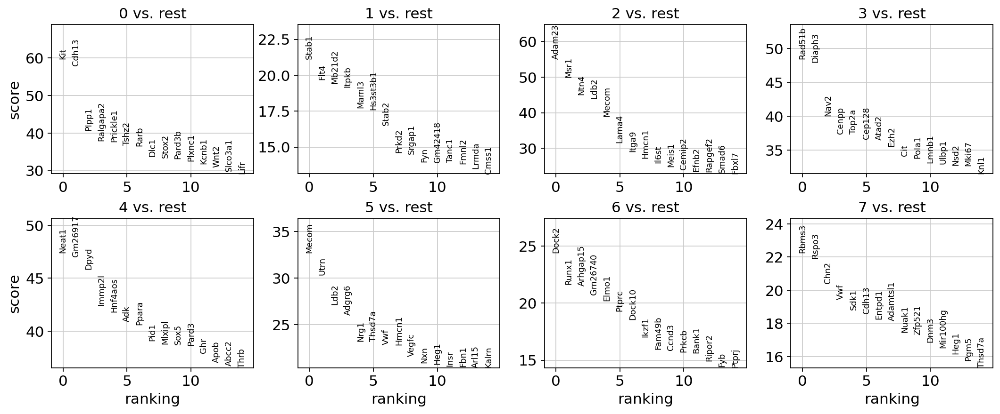

In [6]:
sc.set_figure_params(figsize=(4,3))

sc.pl.rank_genes_groups(adata_endo_subset_ALL_GENES, 
                        n_genes=15, 
                        sharey=False, 
                        key="leiden_scVI_res_0.5_endo_wilcoxon",
                        ncols=4,
                        #save='_Ranked_Genes_For_ECs.pdf'
                       )

# <br> 7. Determine the Celltype of Each Cluster

In [7]:
print(adata_endo_subset_ALL_GENES)

AnnData object with n_obs × n_vars = 25125 × 22917
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'Barcode', 'OrigIdent-Barcode', 'Seurat_Celltype', 'doublet_scores', 'predicted_doublets', 'doublet_info', 'leiden_scVI_res_0.05', 'leiden_scVI_res_0.1', 'leiden_scVI_res_0.25', 'leiden_scVI_res_0.5', 'leiden_scVI_res_0.75', 'leiden_scVI_res_1.50', 'leiden_scVI_res_0.05_endo', 'leiden_scVI_res_0.1_endo', 'leiden_scVI_res_0.25_endo', 'leiden_scVI_res_0.5_endo', 'leiden_scVI_res_0.75_endo'
    uns: 'OrigIdent_colors', 'doublet_info_colors', 'leiden', 'leiden_scVI_res_0.25_colors', 'leiden_scVI_res_0.5_endo_wilcoxon', 'log1p', 'neighbors', 'umap'
    obsm: 'X_scVI', 'X_scVI_train_endo', 'X_umap'
    layers: 'counts', 'log1p_counts'
    obsp: 'connectivities', 'distances'


The 0.5 resolution seem like a good starting points.

/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


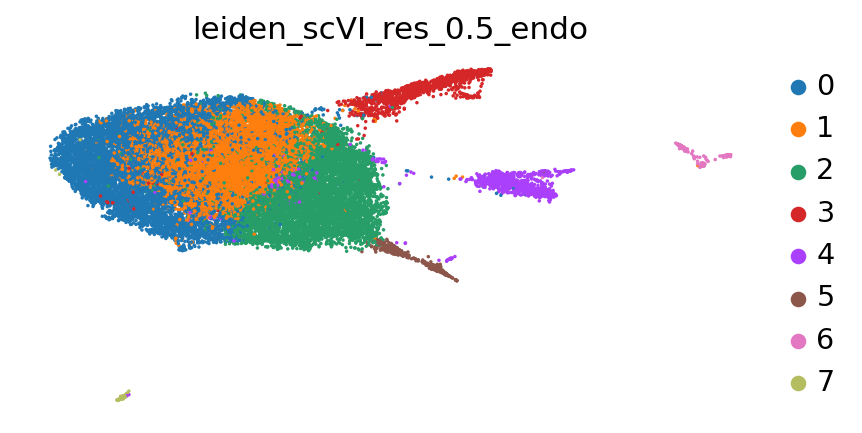

In [8]:
sc.pl.umap(
    adata_endo_subset_ALL_GENES,
    color=["leiden_scVI_res_0.5_endo"],
    frameon=False,
    size=10,
)


### <br> Cluster 0
Pericentral LSECs
- Kit is Percentral LSECs (https://doi.org/ 10.1016/j.jcmgh.2020.12.007)

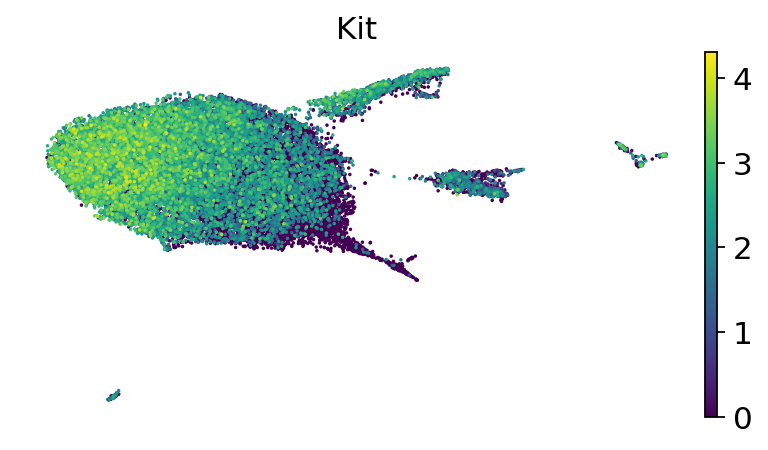

In [9]:
sc.pl.umap(
    adata_endo_subset_ALL_GENES,
    color=["Kit"],
    frameon=False,
    size=10,
)


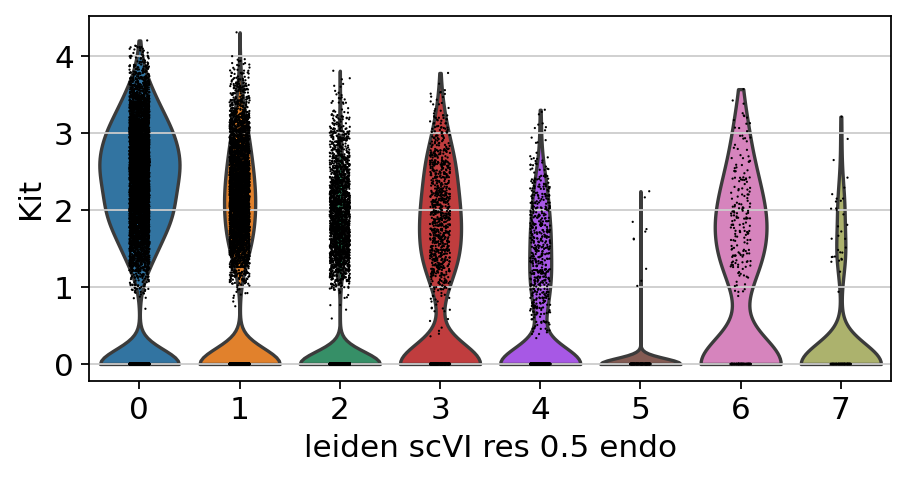

In [10]:
sc.pl.violin(
    adata_endo_subset_ALL_GENES,
    keys=['Kit',],
    groupby = 'leiden_scVI_res_0.5_endo',
)

### <br> Cluster 1
Midzonal LSECs
- These have minor transcirption of both pericentral and periportal LSECs, so they are proabbaly midzonal

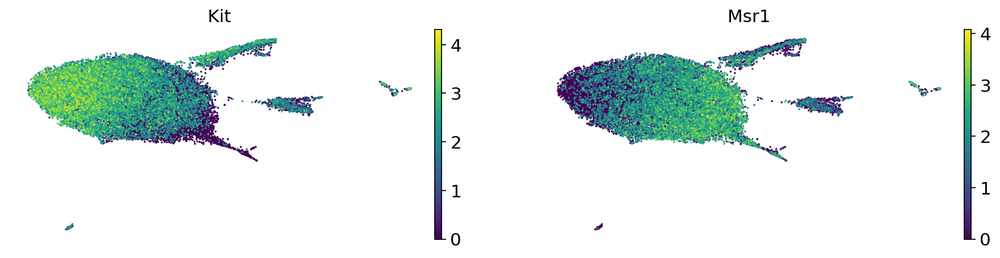

In [11]:
sc.pl.umap(
    adata_endo_subset_ALL_GENES,
    color=["Kit", 'Msr1'],
    frameon=False,
    size=10,
)


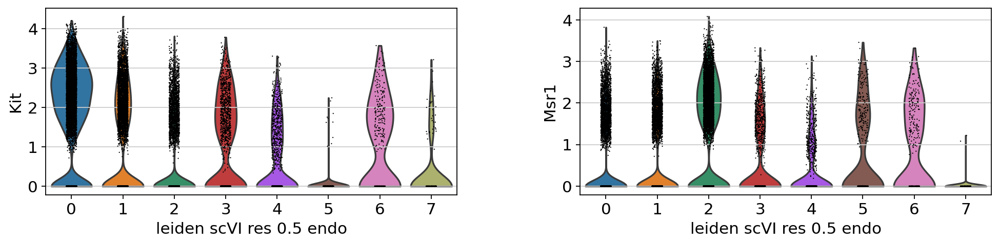

In [12]:
sc.pl.violin(
    adata_endo_subset_ALL_GENES,
    keys=['Kit','Msr1'],
    groupby = 'leiden_scVI_res_0.5_endo',
)

### <br> Cluster 2
Periportal LSECs
- Adam23 and Msr1 are Periportal LSECs (https://doi.org/10.1016/j.jcmgh.2020.12.007)

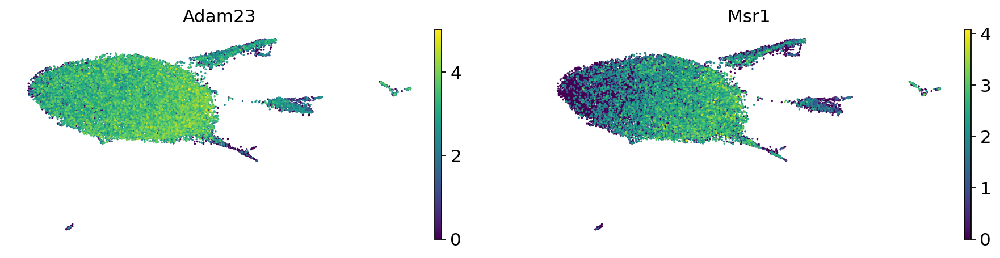

In [13]:
sc.pl.umap(
    adata_endo_subset_ALL_GENES,
    color=["Adam23", 'Msr1'],
    frameon=False,
    size=10,
)


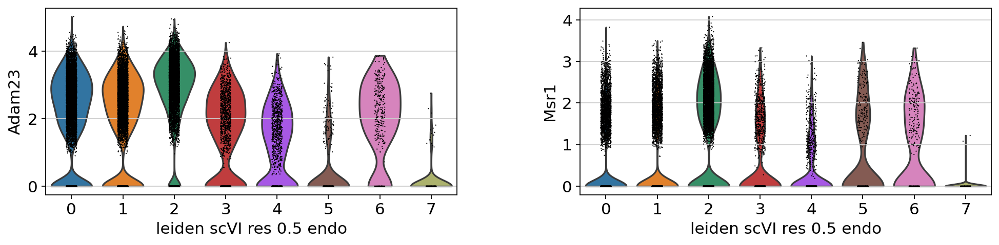

In [14]:
sc.pl.violin(
    adata_endo_subset_ALL_GENES,
    keys=['Adam23', 'Msr1'],
    groupby = 'leiden_scVI_res_0.5_endo',
)

### <br> Cluster 3
Proliferating ECs (PECs)
- It's a proliferating cell based on genes. I'm dubbing them 'Proliferating ECs'

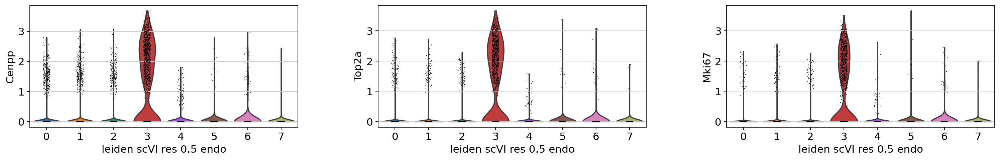

In [15]:
sc.pl.violin(
    adata_endo_subset_ALL_GENES,
    keys=['Cenpp', 'Top2a', 'Mki67'],
    groupby = 'leiden_scVI_res_0.5_endo',
)

### <br> Cluster 4
Lymphatic Endothelial Cells (LyECs)
- Prox1 is Percentral LSECs (https://doi.org/ 10.1016/j.jcmgh.2020.12.007)

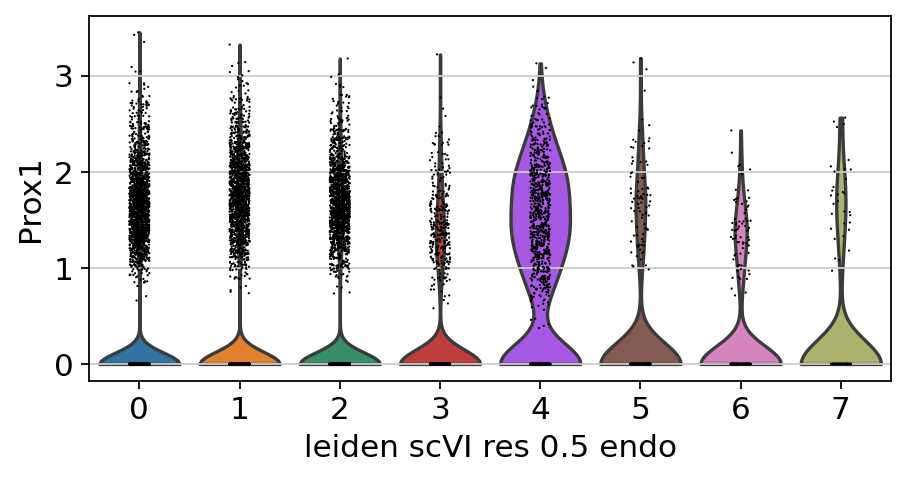

In [16]:
sc.pl.violin(
    adata_endo_subset_ALL_GENES,
    keys=['Prox1'],
    groupby = 'leiden_scVI_res_0.5_endo',
)

### <br> Cluster 5
Periportal VEC (Vascular)
- Vwf is all Vascular ECs (https://doi.org/10.1016/j.jcmgh.2020.12.007)
- Dll4, Efnb2, Msr1, Ltbp4, Ntn4, and Adam23 are general periportal markers (https://doi.org/10.1016/j.jcmgh.2020.12.007)

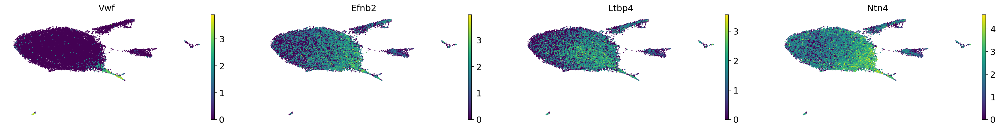

In [17]:
sc.pl.umap(
    adata_endo_subset_ALL_GENES,
    color=["Vwf", 'Efnb2', 'Ltbp4', 'Ntn4'],
    frameon=False,
    size=10,
)

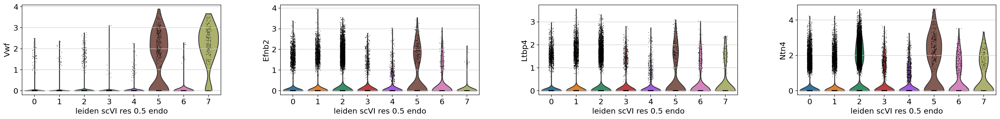

In [18]:
sc.pl.violin(
    adata_endo_subset_ALL_GENES,
    keys=["Vwf", 'Efnb2', 'Ltbp4', 'Ntn4'],
    groupby = 'leiden_scVI_res_0.5_endo',
)

### <br> Cluster 6
Unknown minor population
- Maybe a lymphocyte based on Dock2  and Arhgap expression (https://www.biorxiv.org/content/10.1101/2021.03.31.437725v1.full)

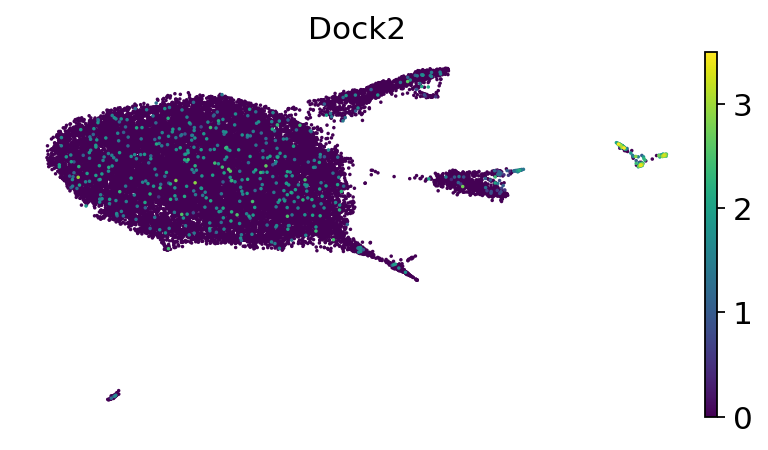

In [19]:
sc.pl.umap(
    adata_endo_subset_ALL_GENES,
    color=["Dock2"],
    frameon=False,
    size=10,
)

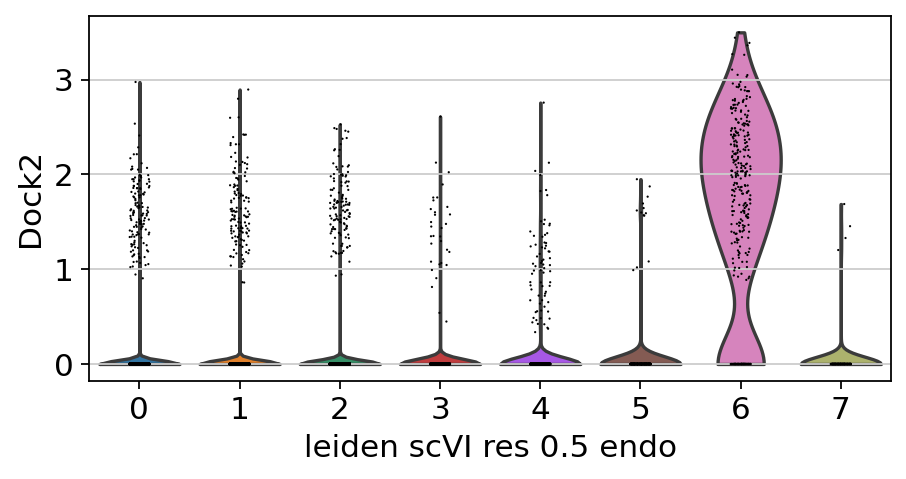

In [20]:
sc.pl.violin(
    adata_endo_subset_ALL_GENES,
    keys=['Dock2'],
    groupby = 'leiden_scVI_res_0.5_endo',
)

### <br> Cluster 7
Pericentral VEC (Vascular)
- Vwf is all Vascular ECs (https://doi.org/10.1016/j.jcmgh.2020.12.007)
- 'Cdh13', 'Thbd', 'Fabp4' are general pericentral markers (https://doi.org/10.1016/j.jcmgh.2020.12.007)

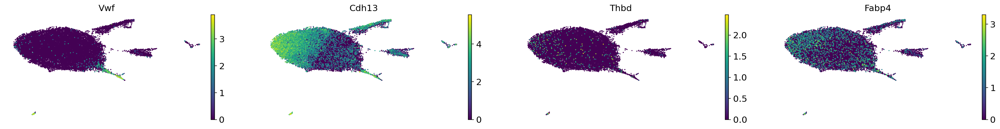

In [21]:
sc.pl.umap(
    adata_endo_subset_ALL_GENES,
    color=["Vwf",  'Cdh13', 'Thbd', 'Fabp4'],
    frameon=False,
    size=10,
)

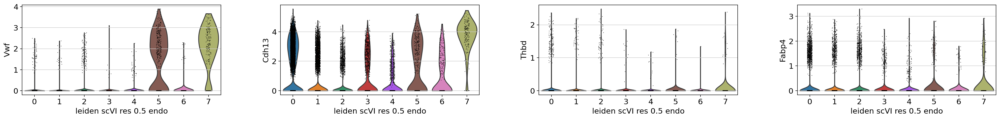

In [22]:
sc.pl.violin(
    adata_endo_subset_ALL_GENES,
    keys=["Vwf",  'Cdh13', 'Thbd', 'Fabp4'],
    groupby = 'leiden_scVI_res_0.5_endo',
)

# <br> 8. Label Cell Types in Adata Object:


In [13]:
bdata = adata_endo_subset_ALL_GENES.copy()

In [14]:
bdata.obs['Celltype'] = "Null"
bdata.obs['Cell_Subtype'] = "Null"

In [15]:
bdata.obs['Celltype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '0', "ECs", bdata.obs['Celltype'])
bdata.obs['Celltype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '1', "ECs", bdata.obs['Celltype'])
bdata.obs['Celltype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '2', "ECs", bdata.obs['Celltype'])
bdata.obs['Celltype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '3', "ECs", bdata.obs['Celltype'])
bdata.obs['Celltype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '4', "ECs", bdata.obs['Celltype'])
bdata.obs['Celltype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '5', "ECs", bdata.obs['Celltype'])
bdata.obs['Celltype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '6', "ECs", bdata.obs['Celltype'])
bdata.obs['Celltype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '7', "ECs", bdata.obs['Celltype'])


bdata.obs['Cell_Subtype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '0', "Pericentral LSECs", bdata.obs['Cell_Subtype'])
bdata.obs['Cell_Subtype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '1', "Midzonal LSECs", bdata.obs['Cell_Subtype'])
bdata.obs['Cell_Subtype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '2', "Periportal LSECs", bdata.obs['Cell_Subtype'])
bdata.obs['Cell_Subtype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '3', "PECs", bdata.obs['Cell_Subtype'])
bdata.obs['Cell_Subtype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '4', "LyECs", bdata.obs['Cell_Subtype'])
bdata.obs['Cell_Subtype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '5', "Periportal VECs", bdata.obs['Cell_Subtype'])
bdata.obs['Cell_Subtype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '6', "Unknown", bdata.obs['Cell_Subtype'])
bdata.obs['Cell_Subtype'] = np.where(bdata.obs['leiden_scVI_res_0.5_endo'] == '7', "Pericentral VECs", bdata.obs['Cell_Subtype'])


/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


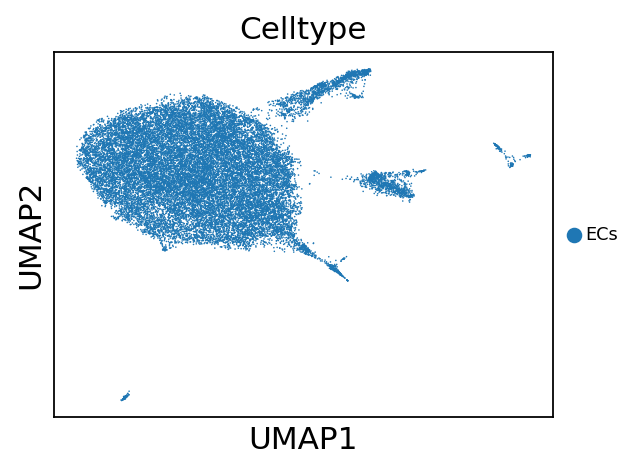

In [16]:
sc.pl.umap(
    bdata,
    color=["Celltype"],
    #legend_loc="on data",
    legend_fontsize=8,
    legend_fontweight='normal',
    frameon=True,
    size=2,
    #palette = sns.color_palette("hls", 10),
    #save='Annotated_Cells_For_Publishing-TCDDOnly.pdf'
)

/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


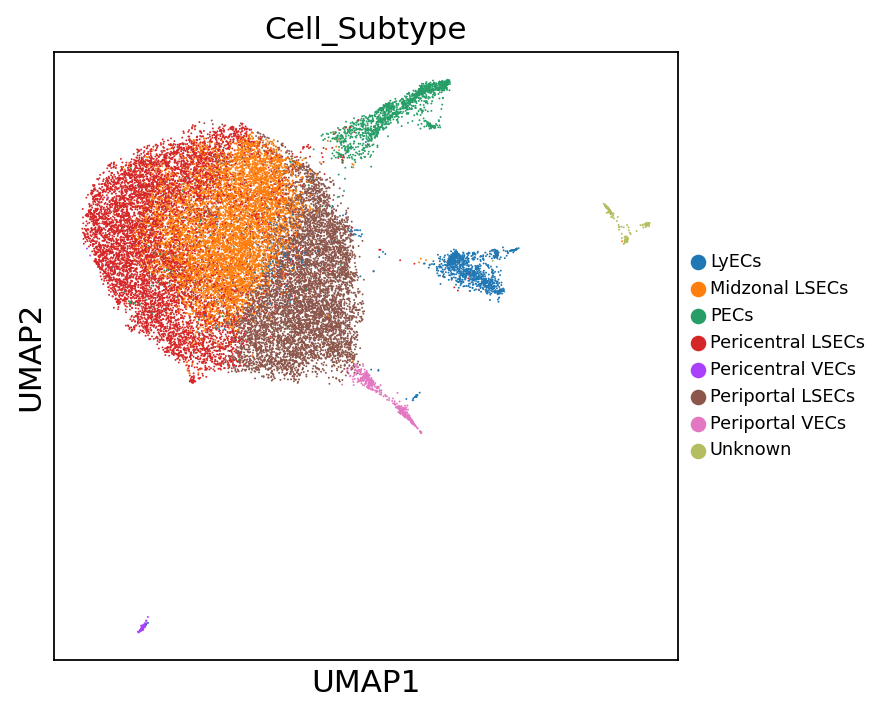

In [17]:
sc.set_figure_params(figsize=(5,5))
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'
pd.options.display.max_colwidth = 200

sc.pl.umap(
    bdata,
    color=["Cell_Subtype"],
    #legend_loc="on data",
    legend_fontsize=8,
    legend_fontweight='normal',
    frameon=True,
    size=3,
    #palette = sns.color_palette("hls", 10),
    save='Annotated_EC_Subcelltypes_For_Publishing.pdf'
)

In [18]:
bdata.obs['Cell_Subtype'].value_counts()

Pericentral LSECs    7771
Midzonal LSECs       7096
Periportal LSECs     6834
PECs                 1384
LyECs                1112
Periportal VECs       426
Unknown               326
Pericentral VECs      176
Name: Cell_Subtype, dtype: int64

In [19]:
bdata.obs.Cell_Subtype = bdata.obs.Cell_Subtype.astype("category")
bdata.obs.Cell_Subtype = bdata.obs['Cell_Subtype'].cat.reorder_categories(['Pericentral LSECs', 
                                                                   'Midzonal LSECs', 
                                                                   'Periportal LSECs', 
                                                                   'PECs',
                                                                   'LyECs',        
                                                                   'Periportal VECs',  
                                                                   'Unknown',
                                                                   'Pericentral VECs'])
bdata.obs.index = bdata.obs.index.astype(str)

### Repeat Wilcoxon on object after Cells have been annotated just to make figures cleaner. 

In [8]:
sc.pp.normalize_total(bdata, target_sum=1e4)
sc.pp.log1p(bdata)

In [9]:
sc.tl.rank_genes_groups(bdata, 
                        groupby='Cell_Subtype', 
                        method='wilcoxon', 
                        key_added = "Cell_Subtype_endo_wilcoxon"
                       )

/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numba/core/dispatcher.py:289: UserWarning: Numba extension module 'sparse._numba_extension' failed to load due to 'ModuleNotFoundError(No module named 'numba.targets')'.
  entrypoints.init_all()


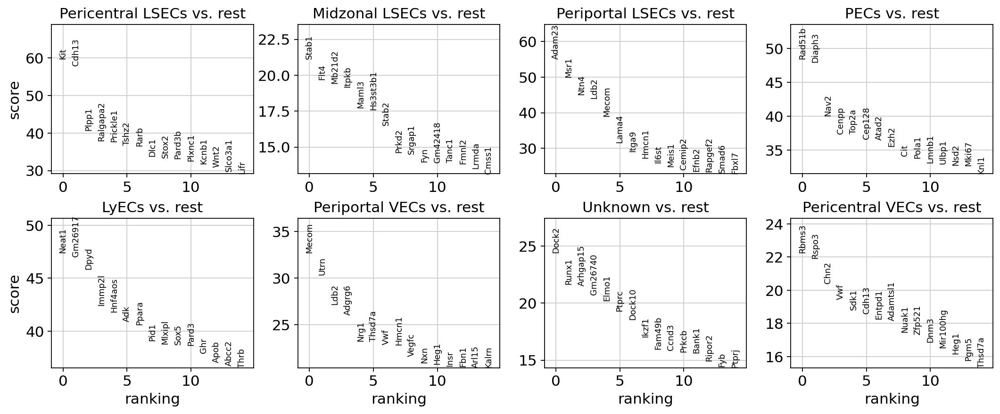

In [10]:
sc.set_figure_params(figsize=(4,3))

sc.pl.rank_genes_groups(bdata, 
                        n_genes=15, 
                        sharey=False, 
                        key="Cell_Subtype_endo_wilcoxon",
                        ncols=4,
                        save='_Ranked_Genes_For_ECs.pdf'
                       )

In [23]:
bdata

AnnData object with n_obs × n_vars = 25125 × 22917
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'Barcode', 'OrigIdent-Barcode', 'Seurat_Celltype', 'doublet_scores', 'predicted_doublets', 'doublet_info', 'leiden_scVI_res_0.05', 'leiden_scVI_res_0.1', 'leiden_scVI_res_0.25', 'leiden_scVI_res_0.5', 'leiden_scVI_res_0.75', 'leiden_scVI_res_1.50', 'leiden_scVI_res_0.05_endo', 'leiden_scVI_res_0.1_endo', 'leiden_scVI_res_0.25_endo', 'leiden_scVI_res_0.5_endo', 'leiden_scVI_res_0.75_endo', 'Celltype', 'Cell_Subtype'
    uns: 'Cell_Subtype_colors', 'Celltype_colors', 'OrigIdent_colors', 'doublet_info_colors', 'leiden', 'leiden_scVI_res_0.25_colors', 'leiden_scVI_res_0.5_endo_colors', 'leiden_scVI_res_0.5_endo_wilcoxon', 'log1p', 'neighbors', 'umap', 'Cell_Subtype_endo_wilcoxon'
    obsm: 'X_scVI', 'X_scVI_train_endo', 'X_umap'
    layers: 'counts', 'log1p_counts'
    obsp: 'connectivities', 'distances'

In [11]:
bdata.write_h5ad('./Adata_Objects/01e_AllGenes_Clustered_Endo.h5ad',compression='gzip')


Load AnnData Object

In [3]:
#bdata = ad.read_h5ad('./Adata_Objects/01e_AllGenes_Clustered_Endo.h5ad')

In [12]:
PECs_Wilcoxon = sc.get.rank_genes_groups_df(bdata, 
                            group='PECs', 
                            key='Cell_Subtype_endo_wilcoxon')

In [15]:
sc.get.rank_genes_groups_df(bdata, 
                            group='PECs', 
                            key='Cell_Subtype_endo_wilcoxon')

,names,scores,logfoldchanges,pvals,pvals_adj
0,Rad51b,48.477886,4.662725,0.000000e+00,0.000000e+00
1,Diaph3,47.991959,6.542343,0.000000e+00,0.000000e+00
2,Nav2,40.052441,3.132548,0.000000e+00,0.000000e+00
3,Cenpp,37.430477,5.711487,1.248277e-306,6.477724e-303
4,Top2a,37.427162,7.165306,1.413301e-306,6.477724e-303
...,...,...,...,...,...
22912,Adam23,-19.516497,-0.989028,7.950574e-85,2.530602e-82
22913,Sema6a,-19.977074,-0.771828,8.718733e-89,2.982197e-86
22914,Malat1,-20.445826,-0.247341,6.544130e-93,2.343310e-90
22915,Ptprb,-20.869631,-0.519904,1.011121e-96,3.737397e-94


In [14]:
PECs_Wilcoxon[PECs_Wilcoxon['names'] == 'Pcna']

,names,scores,logfoldchanges,pvals,pvals_adj
1253,Pcna,4.464652,2.296285,0.000008,0.000128


# <br> 9. Determine Abundace of Each Cell Type Across Time/Dose


In [34]:
meta_data = bdata.obs[['OrigIdent','Dose','Time']].drop_duplicates(keep='first')
cell_data = bdata.obs[['OrigIdent','Cell_Subtype']]

# Group by "OrigIdent" and "Cell_Subtype" and count the occurrences
grouped = cell_data.groupby(["OrigIdent", "Cell_Subtype"]).size().reset_index(name="count")

# Pivot the table
pivot_table = pd.pivot_table(grouped, values='count', index='OrigIdent', columns='Cell_Subtype', fill_value=0)

# Display the pivot table
pivot_table

Cell_Subtype,Pericentral LSECs,Midzonal LSECs,Periportal LSECs,PECs,LyECs,Periportal VECs,Unknown,Pericentral VECs
OrigIdent,,,,,,,,
L001,95,65,90,20,55,3,5,1
L002,308,147,245,34,0,6,5,1
L003,306,187,278,39,3,17,10,5
L016,197,111,136,5,33,6,1,1
L018,185,119,142,20,2,9,2,2
L019,343,273,297,64,7,13,6,7
L021,150,74,160,2,9,7,6,3
L022,177,146,105,30,98,4,16,1
L023,335,265,253,36,18,18,23,10


In [35]:
pivot_table.to_csv('./Cell(sub)type_Counts/01e_Endo_CellCounts_Split_by_Dose_and_Time.txt', sep='\t')
meta_data.to_csv('./Cell(sub)type_Counts/01e_Endo_MetaData_Split_by_Dose_and_Time.txt', sep='\t', index=None)

# <br> 9. Conclusion:
Endothelial cell subpopulations were identified in this workbook. 